In [6]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
df_train = pd.read_csv('train.csv',index_col=0)
print(df_train.shape)
df_train.head()
df_train1 = df_train.copy()

(1460, 80)


In [3]:
df_test = pd.read_csv('test.csv',index_col=0)
print(df_test.shape)
df_test.head()

(1459, 79)


,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
Id,,,,,,,,,,,,,,,,,,,,,
1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,Inside,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [4]:
y = df_train['SalePrice']
df_train1 = df_train1.drop('SalePrice',axis = 1)

In [5]:
df = pd.concat([df_train1,df_test],axis = 0)
df.shape

(2919, 79)

In [6]:
df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
Id,,,,,,,,,,,,,,,,,,,,,
1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal
2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal
3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal
4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml
5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,...,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal


## Data Preparation

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2919 entries, 1 to 2919
Data columns (total 79 columns):
MSSubClass       2919 non-null int64
MSZoning         2915 non-null object
LotFrontage      2433 non-null float64
LotArea          2919 non-null int64
Street           2919 non-null object
Alley            198 non-null object
LotShape         2919 non-null object
LandContour      2919 non-null object
Utilities        2917 non-null object
LotConfig        2919 non-null object
LandSlope        2919 non-null object
Neighborhood     2919 non-null object
Condition1       2919 non-null object
Condition2       2919 non-null object
BldgType         2919 non-null object
HouseStyle       2919 non-null object
OverallQual      2919 non-null int64
OverallCond      2919 non-null int64
YearBuilt        2919 non-null int64
YearRemodAdd     2919 non-null int64
RoofStyle        2919 non-null object
RoofMatl         2919 non-null object
Exterior1st      2918 non-null object
Exterior2nd      2918 non

In [8]:
df.dtypes.value_counts()

object     43
int64      25
float64    11
dtype: int64

In [9]:
df.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
count,2919.000000,2433.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2896.000000,2918.000000,2918.000000,...,2918.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000
mean,57.137718,69.305795,10168.114080,6.089072,5.564577,1971.312778,1984.264474,102.201312,441.423235,49.582248,...,472.874572,93.709832,47.486811,23.098321,2.602261,16.062350,2.251799,50.825968,6.213087,2007.792737
std,42.517628,23.344905,7886.996359,1.409947,1.113131,30.291442,20.894344,179.334253,455.610826,169.205611,...,215.394815,126.526589,67.575493,64.244246,25.188169,56.184365,35.663946,567.402211,2.714762,1.314964
min,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000
25%,20.000000,59.000000,7478.000000,5.000000,5.000000,1953.500000,1965.000000,0.000000,0.000000,0.000000,...,320.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,2007.000000
50%,50.000000,68.000000,9453.000000,6.000000,5.000000,1973.000000,1993.000000,0.000000,368.500000,0.000000,...,480.000000,0.000000,26.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000
75%,70.000000,80.000000,11570.000000,7.000000,6.000000,2001.000000,2004.000000,164.000000,733.000000,0.000000,...,576.000000,168.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000
max,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1526.000000,...,1488.000000,1424.000000,742.000000,1012.000000,508.000000,576.000000,800.000000,17000.000000,12.000000,2010.000000


1.8828757597682129


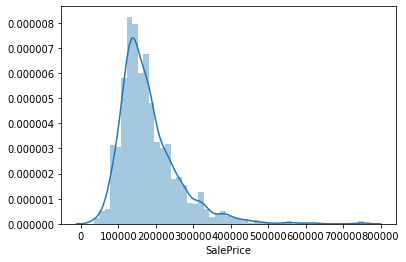

In [10]:
sns.distplot(y)
print(y.skew())


 mu = 180921.20 and sigma = 79415.29



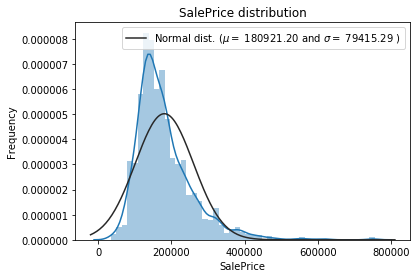

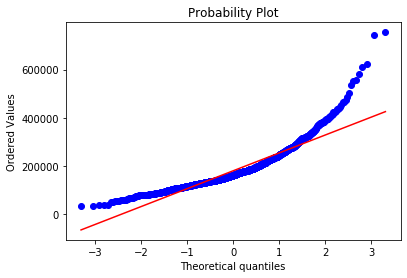

In [11]:
from scipy import stats
from scipy.stats import norm, skew
sns.distplot(y , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(y)
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('SalePrice distribution')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(y, plot=plt)
plt.show()

0.12134661989685333


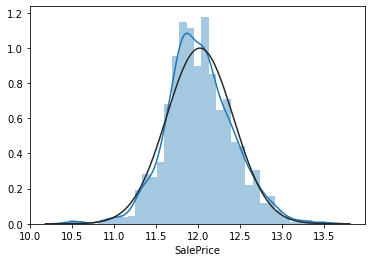

In [12]:
y_log = np.log1p(y)
print(y_log.skew())
sns.distplot(y_log,fit = norm)

In [13]:
df['MSSubClass'] = df['MSSubClass'].astype(str)
df['MoSold'] = df['MoSold'].astype(str)
df['YrSold'] = df['YrSold'].astype(str)
df['OverallCond'] = df['OverallCond'].astype(str)

In [14]:
df['TotalSF'] = df['TotalBsmtSF'] + df['1stFlrSF'] + df['2ndFlrSF']
# Removing TotalBsmtSF,1stFlrSF, 2ndFlrSF and Id
df = df.drop(["TotalBsmtSF"], axis=1)
df = df.drop(["1stFlrSF"], axis=1)
df = df.drop(["2ndFlrSF"], axis=1)

In [15]:
df.shape

(2919, 77)

## Splitting features into categorical and numerical

In [16]:
df_cat = df.select_dtypes(include = 'object')
print(df_cat.shape)
df_num = df.select_dtypes(include = ['int64','float64'])
print(df_num.shape)

(2919, 47)
(2919, 30)


In [17]:
df_num.head()

,LotFrontage,LotArea,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,LowQualFinSF,...,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,TotalSF
Id,,,,,,,,,,,,,,,,,,,,,
1,65.0,8450,7,2003,2003,196.0,706.0,0.0,150.0,0,...,2.0,548.0,0,61,0,0,0,0,0,2566.0
2,80.0,9600,6,1976,1976,0.0,978.0,0.0,284.0,0,...,2.0,460.0,298,0,0,0,0,0,0,2524.0
3,68.0,11250,7,2001,2002,162.0,486.0,0.0,434.0,0,...,2.0,608.0,0,42,0,0,0,0,0,2706.0
4,60.0,9550,7,1915,1970,0.0,216.0,0.0,540.0,0,...,3.0,642.0,0,35,272,0,0,0,0,2473.0
5,84.0,14260,8,2000,2000,350.0,655.0,0.0,490.0,0,...,3.0,836.0,192,84,0,0,0,0,0,3343.0


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001ECCC4269C8>,
      dtype=object)

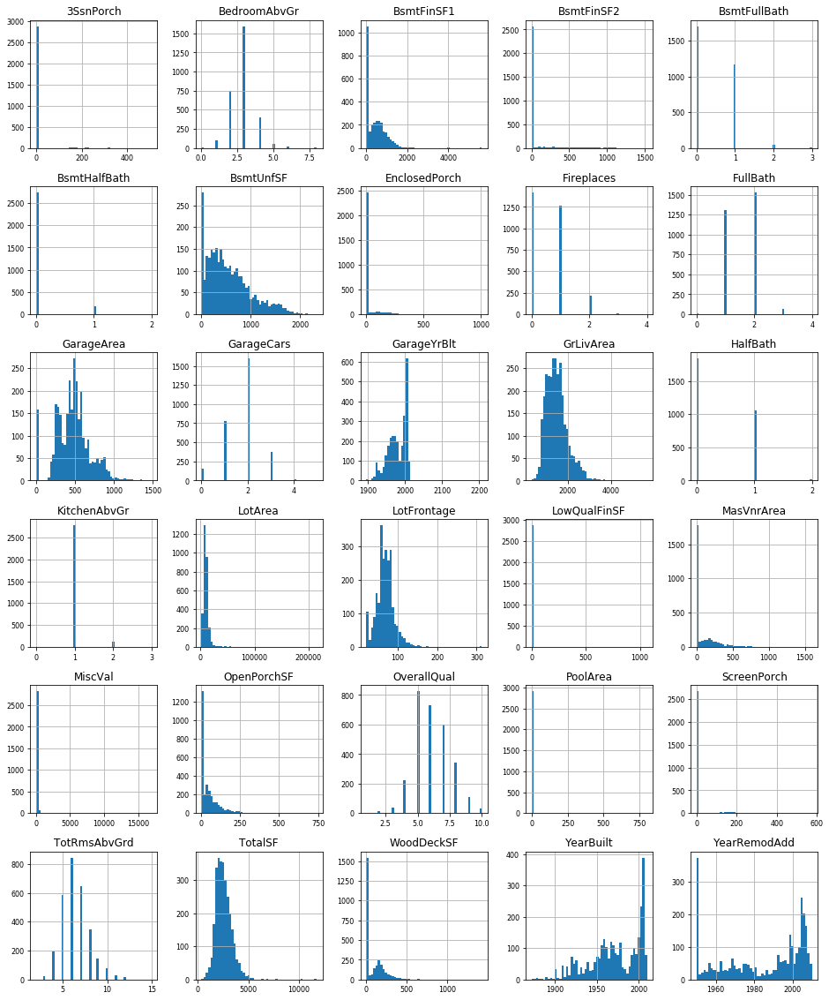

In [18]:
df_num.hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8)

In [19]:
from scipy.stats import skew
df_num_skew = df_num.apply(lambda x: skew(x.dropna()))
df_num_skew = df_num_skew[df_num_skew>0.75]
df_num[df_num_skew.index] = np.log1p(df_num[df_num_skew.index])

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001ECCC426548>,
      dtype=object)

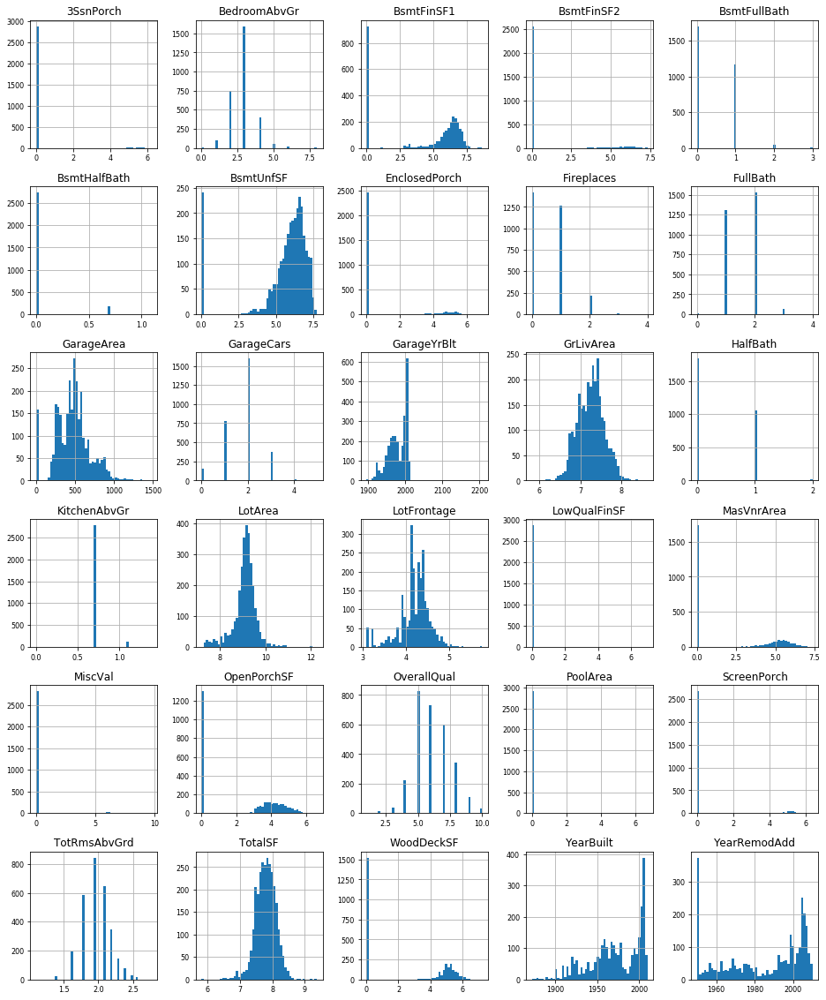

In [20]:
df_num.hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8)

In [21]:
df_num.skew()

LotFrontage      -0.857099
LotArea          -0.505010
OverallQual       0.197212
YearBuilt        -0.600114
YearRemodAdd     -0.451252
MasVnrArea        0.524279
BsmtFinSF1       -0.617962
BsmtFinSF2        2.463138
BsmtUnfSF        -2.159736
LowQualFinSF      8.562091
GrLivArea         0.013194
BsmtFullBath      0.624062
BsmtHalfBath      3.775149
FullBath          0.167692
HalfBath          0.694924
BedroomAbvGr      0.326492
KitchenAbvGr      3.522161
TotRmsAbvGrd      0.035125
Fireplaces        0.733872
GarageYrBlt      -0.382150
GarageCars       -0.218373
GarageArea        0.241301
WoodDeckSF        0.158114
OpenPorchSF      -0.041819
EnclosedPorch     1.962089
3SsnPorch         8.829794
ScreenPorch       2.947420
PoolArea         15.006047
MiscVal           5.216665
TotalSF          -0.362676
dtype: float64

In [22]:
df_num.head()

,LotFrontage,LotArea,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,LowQualFinSF,...,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,TotalSF
Id,,,,,,,,,,,,,,,,,,,,,
1,4.189655,9.042040,7,2003,2003,5.283204,6.561031,0.0,5.017280,0.0,...,2.0,548.0,0.000000,4.127134,0.000000,0.0,0.0,0.0,0.0,7.850493
2,4.394449,9.169623,6,1976,1976,0.000000,6.886532,0.0,5.652489,0.0,...,2.0,460.0,5.700444,0.000000,0.000000,0.0,0.0,0.0,0.0,7.833996
3,4.234107,9.328212,7,2001,2002,5.093750,6.188264,0.0,6.075346,0.0,...,2.0,608.0,0.000000,3.761200,0.000000,0.0,0.0,0.0,0.0,7.903596
4,4.110874,9.164401,7,1915,1970,0.000000,5.379897,0.0,6.293419,0.0,...,3.0,642.0,0.000000,3.583519,5.609472,0.0,0.0,0.0,0.0,7.813592
5,4.442651,9.565284,8,2000,2000,5.860786,6.486161,0.0,6.196444,0.0,...,3.0,836.0,5.262690,4.442651,0.000000,0.0,0.0,0.0,0.0,8.114923


## Missing Value Treatment

In [23]:
df2 = df[[column for column in df if ((df[column].isnull().sum())/len(df))>=0.3]]
df2.shape
df1 = df[[col for col in df if col not in df2]]

In [24]:
total = df1.isnull().sum().sort_values(ascending = False)
percent = ((df1.isnull().sum()/len(df))*100).sort_values(ascending = False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(25)

,Total,Percent
LotFrontage,486,16.649538
GarageYrBlt,159,5.447071
GarageFinish,159,5.447071
GarageCond,159,5.447071
GarageQual,159,5.447071
GarageType,157,5.378554
BsmtCond,82,2.809181
BsmtExposure,82,2.809181
BsmtQual,81,2.774923
BsmtFinType2,80,2.740665


In [25]:
df_cat = df1.select_dtypes(include = 'object')
df_cat.shape

(2919, 42)

In [26]:
for i in list(df_num.columns):
    df_num[i] = df_num[i].fillna(df_num[i].median())

In [27]:
for i in list(df_cat.columns):
    df_cat[i].fillna(method = 'ffill',inplace = True)

In [28]:
df_cat.head()

,MSSubClass,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,Functional,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,MoSold,YrSold,SaleType,SaleCondition
Id,,,,,,,,,,,,,,,,,,,,,
1,60,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,...,Typ,Attchd,RFn,TA,TA,Y,2,2008,WD,Normal
2,20,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,...,Typ,Attchd,RFn,TA,TA,Y,5,2007,WD,Normal
3,60,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,...,Typ,Attchd,RFn,TA,TA,Y,9,2008,WD,Normal
4,70,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,...,Typ,Detchd,Unf,TA,TA,Y,2,2006,WD,Abnorml
5,60,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,...,Typ,Attchd,RFn,TA,TA,Y,12,2008,WD,Normal


In [29]:
df_cat = pd.get_dummies(df_cat,drop_first=True)

In [30]:
df_cat.head()

,MSSubClass_150,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSSubClass_20,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
Id,,,,,,,,,,,,,,,,,,,,,
1,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,1,0,0,0,1,0
2,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,0
3,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,1,0,0,0,1,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,1,0,0,0,1,0


In [31]:
df_cat.shape

(2919, 234)

In [32]:
newdf = pd.concat([df_num,df_cat],axis = 1)
newdf.shape

(2919, 264)

In [33]:
X_train = newdf.iloc[:1460,:]
X_train.shape

(1460, 264)

Text(0.5, 1, 'Correlation between features')

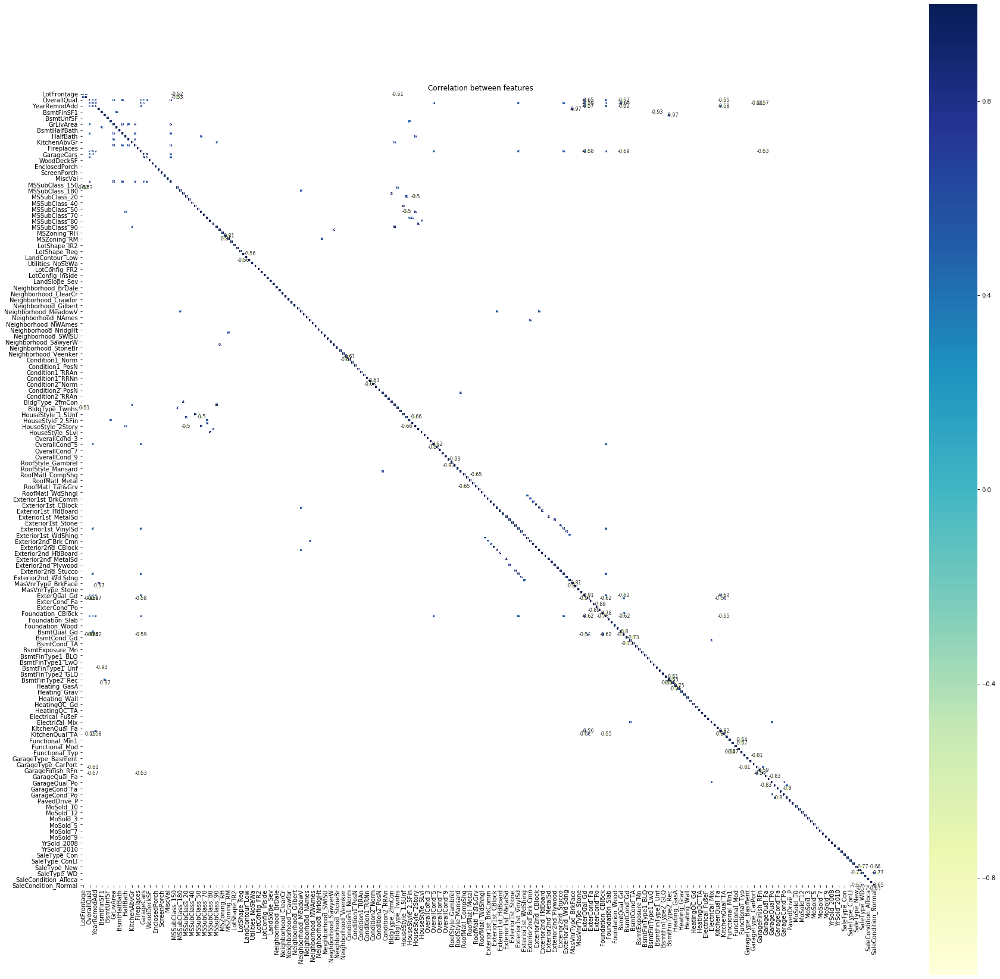

In [34]:
corr=X_train.corr()
plt.figure(figsize=(30, 30))

sns.heatmap(corr[(corr >= 0.5) | (corr <= -0.5)], 
            cmap='YlGnBu', vmax=1.0, vmin=-1.0, linewidths=0.1,
            annot=True, annot_kws={"size": 8}, square=True);
plt.title('Correlation between features')

In [35]:
X_test = newdf.iloc[1460:,:]
X_test.shape

(1459, 264)

## Converting train and test data into pc-dimensions

In [35]:
from sklearn.decomposition import PCA
pca = PCA()
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

In [38]:
var_exp = pca.explained_variance_ratio_
cum_var_exp = np.cumsum((var_exp)*100)
np.set_printoptions(threshold=1000)
cum_var_exp

array([ 96.72074421,  99.10187481,  99.57894342,  99.88902475,
        99.9095642 ,  99.92225347,  99.93473398,  99.94304209,
        99.95013845,  99.95550742,  99.96075417,  99.96456742,
        99.96772545,  99.97011319,  99.97188175,  99.9733539 ,
        99.97449101,  99.9755541 ,  99.97654694,  99.97740155,
        99.97816398,  99.97888614,  99.9795601 ,  99.98019754,
        99.98079981,  99.9813691 ,  99.98191605,  99.98242653,
        99.98291823,  99.98340064,  99.98386051,  99.98430825,
        99.98475087,  99.98517672,  99.98558724,  99.98597871,
        99.9863585 ,  99.98673173,  99.9870888 ,  99.98743656,
        99.98777398,  99.9881064 ,  99.9884279 ,  99.98873467,
        99.98903157,  99.98932643,  99.98961109,  99.98988876,
        99.99015472,  99.99041594,  99.99067123,  99.99091657,
        99.99115384,  99.991385  ,  99.99160454,  99.99182267,
        99.99203221,  99.99223418,  99.99243202,  99.99261957,
        99.99280357,  99.9929835 ,  99.99316114,  99.99

In [91]:
pca = PCA(n_components=3)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

In [77]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn import metrics

In [78]:
lr = LinearRegression()
lr.fit(X_train_pca,y_log)
pred = lr.predict(X_train_pca)
metrics.mean_squared_error(y_log,pred)

0.015779774030455752

In [105]:
lr.fit(X_train,y)
pred_orig = lr.predict(X_train)
mse0 = metrics.mean_squared_error(y,pred_orig)
rmse0 = np.sqrt(mse0)
print(rmse0)
lr_pred = lr.predict(X_test)
lr_pred

22846.876055309378


array([114496.08233104, 162094.00716258, 190353.45542177, ...,
       183270.08362097, 107530.14732372, 216034.60854329])

In [99]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint as sp_randint
rfc = RandomForestRegressor()
params = {'n_estimators': sp_randint(50,200),'max_features': sp_randint(1,264), 'max_depth': sp_randint(2,10),
         'min_samples_split': sp_randint(2,20), 'min_samples_leaf': sp_randint(1,20)}

rsearch_rfc = RandomizedSearchCV(rfc,param_distributions=params,n_iter = 200, cv = 3,scoring = 'r2', random_state=3,return_train_score= True)
rsearch_rfc.fit(X_train,y)

RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=RandomForestRegressor(bootstrap=True,
                                                   ccp_alpha=0.0,
                                                   criterion='mse',
                                                   max_depth=None,
                                                   max_features='auto',
                                                   max_leaf_nodes=None,
                                                   max_samples=None,
                                                   min_impurity_decrease=0.0,
                                                   min_impurity_split=None,
                                                   min_samples_leaf=1,
                                                   min_samples_split=2,
                                                   min_weight_fraction_leaf=0.0,
                                                   n_estimators=100,
                              

In [100]:
rsearch_rfc.best_params_

{'max_depth': 8,
 'max_features': 50,
 'min_samples_leaf': 1,
 'min_samples_split': 4,
 'n_estimators': 111}

In [101]:
rf = RandomForestRegressor(**rsearch_rfc.best_params_)
rf.fit(X_train,y)
pred_orig1 = rf.predict(X_train)
mse = metrics.mean_squared_error(y,pred_orig1)
rmse = np.sqrt(mse)
rmse

17247.761959097425

In [106]:
pred_test = rf.predict(X_test)
sub = pd.Series(pred_test)

In [109]:
X_test['price_predicted'] = pred_test

In [112]:
submission1 = X_test['price_predicted']
submission1.to_csv('submission1.csv')

In [113]:
newdf.head()

,LotFrontage,LotArea,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,LowQualFinSF,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
Id,,,,,,,,,,,,,,,,,,,,,
1,4.189655,9.042040,7,2003,2003,5.283204,6.561031,0.0,5.017280,0.0,...,0,0,0,0,1,0,0,0,1,0
2,4.394449,9.169623,6,1976,1976,0.000000,6.886532,0.0,5.652489,0.0,...,0,0,0,0,1,0,0,0,1,0
3,4.234107,9.328212,7,2001,2002,5.093750,6.188264,0.0,6.075346,0.0,...,0,0,0,0,1,0,0,0,1,0
4,4.110874,9.164401,7,1915,1970,0.000000,5.379897,0.0,6.293419,0.0,...,0,0,0,0,1,0,0,0,0,0
5,4.442651,9.565284,8,2000,2000,5.860786,6.486161,0.0,6.196444,0.0,...,0,0,0,0,1,0,0,0,1,0


### After Feature Selection

In [120]:
import statsmodels.api as sm
Xc = sm.add_constant(X_train)

In [121]:
cols = list(Xc.columns)
while len(cols)>1:
    X_1 = Xc[cols]
    model = sm.OLS(y,X_1,random_state = 3).fit()
    p = model.pvalues
    max_p = max(p)
    feature_maxp = p.idxmax()
    
    if max_p>0.05:
        print('\n')
        print('removed feature: ', feature_maxp, 'pvalue: ', max_p)
        cols.remove(feature_maxp)
    else:
        break
        
print(cols)



removed feature:  Neighborhood_Blueste pvalue:  0.9979293005739148


removed feature:  GarageFinish_Unf pvalue:  0.9884200764692016


removed feature:  MSSubClass_60 pvalue:  0.9787959462697544


removed feature:  Condition1_RRNe pvalue:  0.9770661364605574


removed feature:  Exterior1st_BrkComm pvalue:  0.9759797056056942


removed feature:  MoSold_5 pvalue:  0.9550947681105832


removed feature:  MoSold_7 pvalue:  0.9607854536390178


removed feature:  Electrical_FuseF pvalue:  0.9374614065320241


removed feature:  HouseStyle_1.5Unf pvalue:  0.9434849896035055


removed feature:  Exterior2nd_Wd Shng pvalue:  0.931805608014032


removed feature:  Exterior2nd_Stucco pvalue:  0.9654723721442736


removed feature:  MSSubClass_75 pvalue:  0.9273598944982943


removed feature:  BsmtFinSF2 pvalue:  0.9193645761765241


removed feature:  HeatingQC_Po pvalue:  0.8931656053224674


removed feature:  MiscVal pvalue:  0.8914056648687001


removed feature:  Exterior1st_CemntBd pvalue:  0.8839


removed feature:  Neighborhood_Somerst pvalue:  0.19895759744217953


removed feature:  Neighborhood_Veenker pvalue:  0.2359244433814485


removed feature:  MasVnrType_None pvalue:  0.21679287463220623


removed feature:  MasVnrArea pvalue:  0.4495942895089545


removed feature:  BsmtFinType2_LwQ pvalue:  0.17570776697074258


removed feature:  GarageArea pvalue:  0.1621491611953968


removed feature:  Heating_Grav pvalue:  0.13480347004641724


removed feature:  Heating_GasW pvalue:  0.7132600586335788


removed feature:  Heating_Wall pvalue:  0.5629252675026484


removed feature:  Heating_OthW pvalue:  0.2516409361606208


removed feature:  Heating_GasA pvalue:  0.27146535529949495


removed feature:  WoodDeckSF pvalue:  0.12715725415765589


removed feature:  YrSold_2009 pvalue:  0.13593266712806573


removed feature:  ScreenPorch pvalue:  0.12858602261326926


removed feature:  Condition1_PosN pvalue:  0.12872135322029488


removed feature:  SaleCondition_AdjLand pvalue:  0.127436

In [124]:
X_test_new = X_test[cols[1:]]
X_test_new.shape

(1459, 91)

In [204]:
X_train_new = X_train[cols[1:]]
X_train_new.shape

(1460, 91)

In [129]:
rfc_new = RandomForestRegressor()
params = {'n_estimators': sp_randint(50,200),'max_features': sp_randint(1,264), 'max_depth': sp_randint(2,10),
         'min_samples_split': sp_randint(2,20), 'min_samples_leaf': sp_randint(1,20)}

rsearch_rfc_new = RandomizedSearchCV(rfc_new,param_distributions=params,n_iter = 200, cv = 3,scoring = 'r2', random_state=3,return_train_score= True)
rsearch_rfc_new.fit(X_train_new,y)

RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=RandomForestRegressor(bootstrap=True,
                                                   ccp_alpha=0.0,
                                                   criterion='mse',
                                                   max_depth=None,
                                                   max_features='auto',
                                                   max_leaf_nodes=None,
                                                   max_samples=None,
                                                   min_impurity_decrease=0.0,
                                                   min_impurity_split=None,
                                                   min_samples_leaf=1,
                                                   min_samples_split=2,
                                                   min_weight_fraction_leaf=0.0,
                                                   n_estimators=100,
                              

In [130]:
rf_new = RandomForestRegressor(**rsearch_rfc_new.best_params_)
rf_new.fit(X_train_new,y)
pred_new_train = rf_new.predict(X_train_new)
mse = metrics.mean_squared_error(y,pred_new_train)
rmse = np.sqrt(mse)
rmse

21674.510825837257

In [132]:
pred_new_test = rf_new.predict(X_test_new)
pred_new_test

array([124440.63404917, 159948.199098  , 177004.59021104, ...,
       157942.74829589, 123147.06046697, 216578.79130067])

In [180]:
from sklearn.ensemble import GradientBoostingRegressor
gf_init = GradientBoostingRegressor(n_estimators=10000)
gf_init.fit(X_train,y)
pred_new_train1 = gf_init.predict(X_train)
mse = metrics.mean_squared_error(y,pred_new_train1)
rmse = np.sqrt(mse)
rmse

2.778172477090687

In [145]:
pred_new_test1 = gf_init.predict(X_test_new) 
pred_new_test1

array([125858.6284006 , 153776.63702427, 179403.04558997, ...,
       143019.60752522, 108656.06555558, 226218.87160762])

In [241]:
from sklearn.ensemble import GradientBoostingRegressor
gf_ori = GradientBoostingRegressor(n_estimators=60000)
gf_ori.fit(X_train,y_log)
pred_ori = gf_ori.predict(X_train)
mse = metrics.mean_squared_error(y_log,pred_ori)
rmse = np.sqrt(mse)
rmse

0.0003161140285279894

In [237]:
from sklearn.model_selection import KFold,cross_val_score
gf_ori = GradientBoostingRegressor(n_estimators=60000)
n_folds = 5
def rmsle_cv(gf_ori):
    kf = KFold(n_folds, shuffle=True, random_state=42).get_n_splits(X_train.values)
    rmse= np.sqrt(-cross_val_score(gf_ori, X_train.values, y_log, scoring="neg_mean_squared_error", cv = kf))
    return rmse

In [238]:
score = rmsle_cv(gf_ori)

In [239]:
score.mean()

0.13246988052710781

In [242]:
pred_20000 = np.expm1(gf_ori.predict(X_test))
pred_20000 = pd.Series(pred_20000)
pred_20000.to_csv('Submission10.csv')

In [205]:
from sklearn.ensemble import GradientBoostingRegressor
gf_ori = GradientBoostingRegressor(n_estimators=60000)
gf_ori.fit(X_train_new,y)
pred_ori = gf_ori.predict(X_train_new)
mse = metrics.mean_squared_error(y,pred_ori)
rmse = np.sqrt(mse)
rmse

138.79372691205188

In [166]:
X_test.head()

,LotFrontage,LotArea,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,LowQualFinSF,...,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,price_predicted
Id,,,,,,,,,,,,,,,,,,,,,
1461,4.394449,9.360741,5,1961,1961,0.000000,6.150603,4.976734,5.602119,0.0,...,0,0,0,1,0,0,0,1,0,127033.919865
1462,4.406719,9.565775,6,1958,1958,4.691348,6.828712,0.000000,6.008813,0.0,...,0,0,0,1,0,0,0,1,0,152992.317265
1463,4.317488,9.534668,5,1997,1998,0.000000,6.674561,0.000000,4.927254,0.0,...,0,0,0,1,0,0,0,1,0,177177.803066
1464,4.369448,9.208238,6,1998,1998,3.044522,6.401917,0.000000,5.783825,0.0,...,0,0,0,1,0,0,0,1,0,185823.982472
1465,3.784190,8.518392,8,1992,1992,0.000000,5.575949,0.000000,6.925595,0.0,...,0,0,0,1,0,0,0,1,0,196806.345238


In [154]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint as sp_randint
from scipy.stats import uniform as sp_uniform
gboost = GradientBoostingRegressor()

params = {'n_estimators': sp_randint(5000,20000),
         'learning_rate': sp_uniform(0.001, 0.5)}

rsearch = RandomizedSearchCV(gboost, param_distributions=params, cv = 5, n_iter = 200, n_jobs = -1, random_state=3,scoring = 'neg_mean_squared_log_error')
rsearch.fit(X_train_new,y)

RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0,
                                                       criterion='friedman_mse',
                                                       init=None,
                                                       learning_rate=0.1,
                                                       loss='ls', max_depth=3,
                                                       max_features=None,
                                                       max_leaf_nodes=None,
                                                       min_impurity_decrease=0.0,
                                                       min_impurity_split=None,
                                                       min_samples_leaf=1,
                                                       min_samples_split=2,
                                                       min_weight_fraction_leaf=0.0,
                             

In [171]:
rsearch.best_params_

{'learning_rate': 0.02201542549678681, 'n_estimators': 5219}

In [177]:
from sklearn.ensemble import GradientBoostingRegressor
gf_rsearch = GradientBoostingRegressor(**rsearch.best_params_)
gf_rsearch.fit(X_train,y)
prediction_rs = gf_rsearch.predict(X_train)
mse = metrics.mean_squared_error(y,prediction_rs)
rmse = np.sqrt(mse)
rmse

3461.5183874749937

In [179]:
pred_tune = gf_rsearch.predict(X_test.iloc[:,:-1])
pred_tune = pd.Series(pred_tune)
pred_tune.to_csv('Submission5.csv')

In [189]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.


In [190]:
import xgboost as xgb

In [199]:
xgb_reg = xgb.XGBRegressor(n_estimators = 30000)
xgb_reg.fit(X_train,y)
xgb_pred = xgb_reg.predict(X_train)
mse = metrics.mean_squared_error(y,xgb_pred)
rmse = np.sqrt(mse)
rmse

0.04760123863571539

In [198]:
xgb_test_pred = xgb_reg.predict(X_test)
xgb_test = pd.Series(xgb_test_pred)
xgb_test.to_csv('Submission7.csv')

## Better way after learning

In [122]:
import numpy as np
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
color = sns.color_palette()
sns.set_style('darkgrid')
import warnings
def ignore_warn(*args, **kwargs):
    pass
warnings.warn = ignore_warn #ignore annoying warning (from sklearn and seaborn)
from scipy import stats
from scipy.stats import norm, skew #for some statistics
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) #Limiting floats output to 3 decimal points

In [123]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

In [124]:
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.000,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.000,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.000,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.000,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.000,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [125]:
test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.000,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.000,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.000,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.000,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.000,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [126]:
train_ID = train['Id']
test_ID = test['Id']
#Now drop the  'Id' colum since it's unnecessary for  the prediction process.
train.drop("Id", axis = 1, inplace = True)
test.drop("Id", axis = 1, inplace = True)

In [127]:
print(train.shape)
print(test.shape)

(1460, 80)
(1459, 79)


## Data Processing

### Outliers

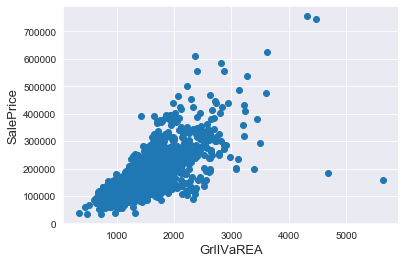

In [128]:
plt.scatter(train['GrLivArea'],train['SalePrice'])
plt.ylabel('SalePrice',fontsize = 13)
plt.xlabel('GrlIVaREA',fontsize = 13)
plt.show()

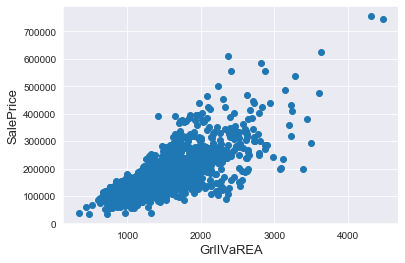

In [129]:
train = train.drop(train[(train['GrLivArea']>4000) & (train['SalePrice']<300000)].index)
plt.scatter(train['GrLivArea'],train['SalePrice'])
plt.ylabel('SalePrice',fontsize = 13)
plt.xlabel('GrlIVaREA',fontsize = 13)
plt.show()

In [130]:
train.shape

(1458, 80)

## Target Variable

mu = 180932.92 and sigma = 79467.79


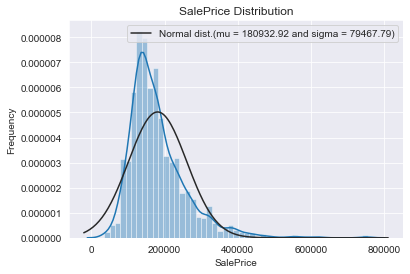

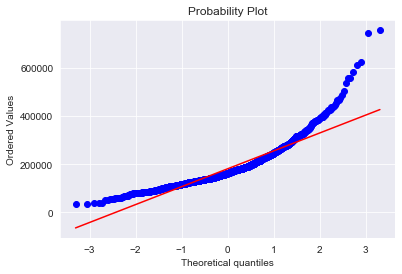

In [131]:
sns.distplot(train['SalePrice'],fit=norm)
(mu,sigma) = norm.fit(train['SalePrice'])
print('mu = {:.2f} and sigma = {:.2f}'.format(mu,sigma))
plt.legend(['Normal dist.(mu = {:.2f} and sigma = {:.2f})'.format(mu,sigma)],loc = 'best')
plt.ylabel('Frequency')
plt.title('SalePrice Distribution')

## Q-Q PLOT
fig = plt.figure()
res = stats.probplot(train['SalePrice'],plot = plt)
plt.show()

mu = 12.02 and sigma = 0.40


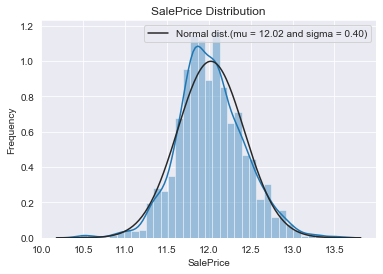

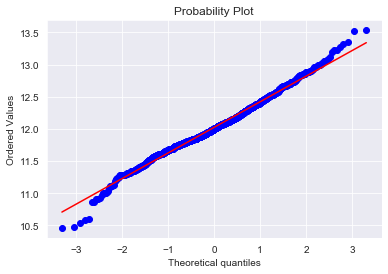

In [132]:
train['SalePrice'] = np.log1p(train['SalePrice'])
sns.distplot(train['SalePrice'],fit=norm)
(mu,sigma) = norm.fit(train['SalePrice'])
print('mu = {:.2f} and sigma = {:.2f}'.format(mu,sigma))
plt.legend(['Normal dist.(mu = {:.2f} and sigma = {:.2f})'.format(mu,sigma)],loc = 'best')
plt.ylabel('Frequency')
plt.title('SalePrice Distribution')

## Q-Q PLOT
fig = plt.figure()
res = stats.probplot(train['SalePrice'],plot = plt)
plt.show()

## Feature Engineering

In [133]:
ntrain = train.shape[0]
ntest = test.shape[0]
y_train = train['SalePrice']
all_data = pd.concat((train,test)).reset_index(drop = True)
all_data = all_data.drop('SalePrice',axis = 1)
print("all_data size is : {}".format(all_data.shape))

all_data size is : (2917, 79)


### Missing Values

In [134]:
all_data_na = (all_data.isnull().sum()/len(all_data))*100
all_data_na = all_data_na.drop(all_data_na[all_data_na ==0].index).sort_values(ascending = False)
missing_data = pd.DataFrame({'missing ratie':all_data_na})
missing_data

,missing ratie
PoolQC,99.691
MiscFeature,96.400
Alley,93.212
Fence,80.425
FireplaceQu,48.680
LotFrontage,16.661
GarageQual,5.451
GarageCond,5.451
GarageFinish,5.451
GarageYrBlt,5.451


Text(0.5, 1.0, 'Percent missing data by features')

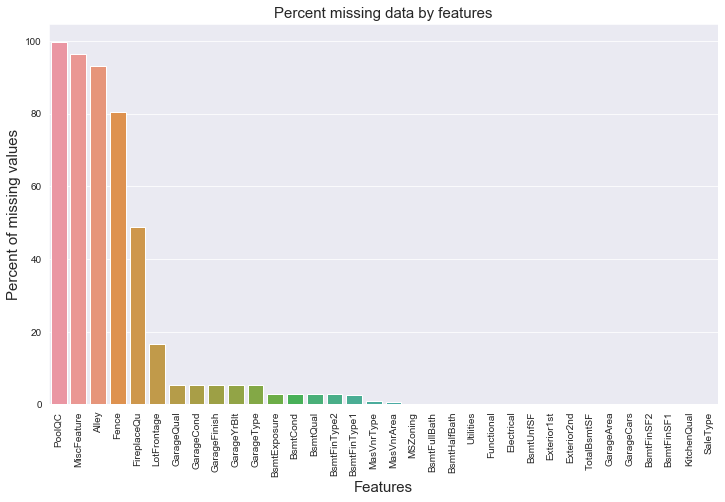

In [135]:
plt.figure(figsize = (12,7))
plt.xticks(rotation = 90)
sns.barplot(x = all_data_na.index, y = all_data_na)
plt.xlabel('Features',fontsize = 15)
plt.ylabel('Percent of missing values', fontsize  = 15)
plt.title('Percent missing data by features',fontsize = 15)

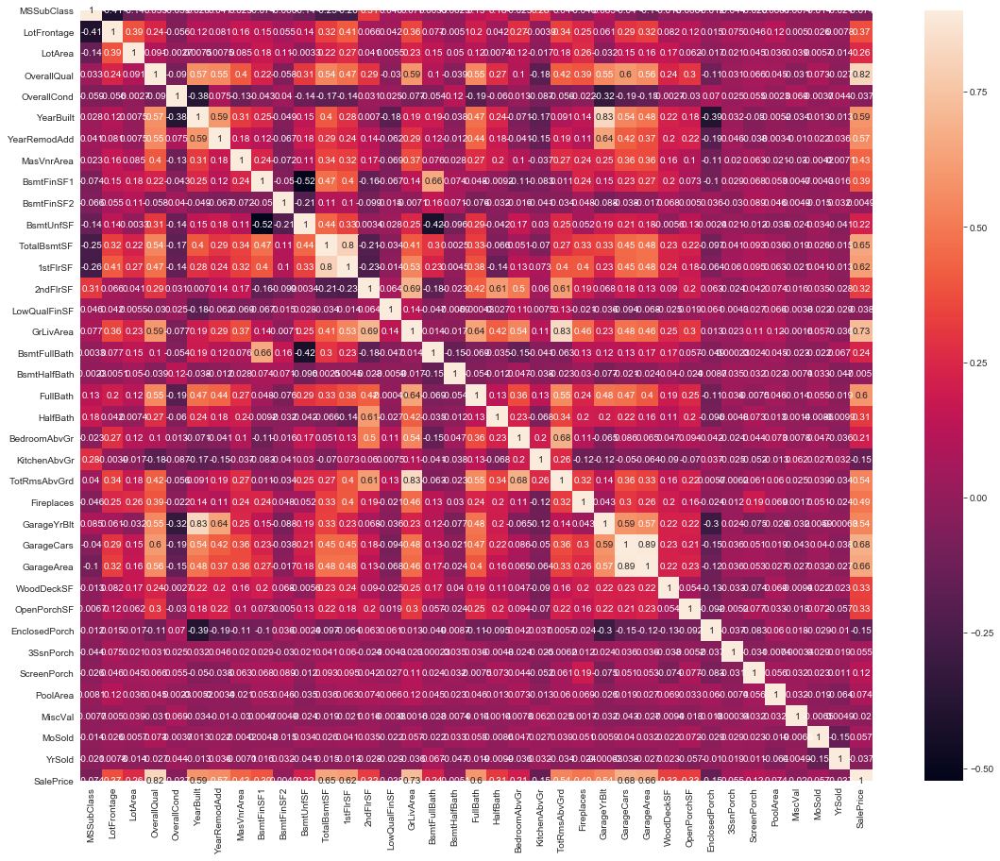

In [21]:
plt.figure(figsize=(20,15))
sns.heatmap(train.corr(), annot = True,square=True,vmax=0.9)

In [136]:
missing_data.index

Index(['PoolQC', 'MiscFeature', 'Alley', 'Fence', 'FireplaceQu', 'LotFrontage',
       'GarageQual', 'GarageCond', 'GarageFinish', 'GarageYrBlt', 'GarageType',
       'BsmtExposure', 'BsmtCond', 'BsmtQual', 'BsmtFinType2', 'BsmtFinType1',
       'MasVnrType', 'MasVnrArea', 'MSZoning', 'BsmtFullBath', 'BsmtHalfBath',
       'Utilities', 'Functional', 'Electrical', 'BsmtUnfSF', 'Exterior1st',
       'Exterior2nd', 'TotalBsmtSF', 'GarageArea', 'GarageCars', 'BsmtFinSF2',
       'BsmtFinSF1', 'KitchenQual', 'SaleType'],
      dtype='object')

#### PoolQc

In [137]:
all_data['PoolQC'] = all_data['PoolQC'].fillna('None')

#### MiscFeature,Alley,Fence,FireplaceQu 

In [138]:
all_data['MiscFeature'] = all_data['MiscFeature'].fillna('None')
all_data['Alley'] = all_data['Alley'].fillna('None')
all_data['Fence'] = all_data['Fence'].fillna('None')
all_data['FireplaceQu'] = all_data['FireplaceQu'].fillna('None')

#### LotFrontage

In [139]:
all_data['LotFrontage'] = all_data.groupby('Neighborhood')['LotFrontage'].transform(lambda x: x.fillna(x.median()))

#### 'GarageQual', 'GarageCond', 'GarageFinish', 'GarageType'

In [140]:
for i in ('GarageQual', 'GarageCond', 'GarageFinish', 'GarageType'):
    all_data[i] = all_data[i].fillna('None')

#### 'GarageArea', 'GarageCars','GarageYrBlt'

In [141]:
for i in ('GarageArea', 'GarageCars','GarageYrBlt'):
    all_data[i] = all_data[i].fillna(0)

#### 'BsmtFinSF2','BsmtFinSF1','BsmtFullBath', 'BsmtHalfBath','TotalBsmtSF','BsmtUnfSF'

In [142]:
for i in ('BsmtFinSF2','BsmtFinSF1','BsmtFullBath', 'BsmtHalfBath','TotalBsmtSF','BsmtUnfSF'):
    all_data[i] = all_data[i].fillna(0)

#### 'BsmtExposure', 'BsmtCond', 'BsmtQual', 'BsmtFinType2', 'BsmtFinType1'

In [143]:
for i in ('BsmtExposure', 'BsmtCond', 'BsmtQual', 'BsmtFinType2', 'BsmtFinType1'):
    all_data[i] = all_data[i].fillna('None')

#### 'MasVnrType', 'MasVnrArea'

In [144]:
all_data['MasVnrType'] = all_data['MasVnrType'].fillna('None')
all_data['MasVnrArea'] = all_data['MasVnrArea'].fillna(0)

#### 'Electrical','KitchenQual','Exterior1st','Exterior2nd','SaleType','MSZoning'

In [145]:
for i in ('Electrical','KitchenQual','Exterior1st','Exterior2nd','SaleType','MSZoning'):
    all_data[i] = all_data[i].fillna(all_data[i].mode()[0])

In [146]:
all_data["Functional"] = all_data["Functional"].fillna("Typ")
all_data = all_data.drop(['Utilities'], axis=1)

In [147]:
all_data.isnull().sum().sort_values(ascending = False)

YrSold         0
Foundation     0
ExterCond      0
ExterQual      0
Exterior1st    0
              ..
MSSubClass     0
MSZoning       0
MasVnrArea     0
MasVnrType     0
1stFlrSF       0
Length: 78, dtype: int64

In [148]:
all_data['MSSubClass'] = all_data['MSSubClass'].astype(str)
all_data['MoSold'] = all_data['MoSold'].astype(str)
all_data['YrSold'] = all_data['YrSold'].astype(str)
all_data['OverallCond'] = all_data['OverallCond'].astype(str)
all_data['TotalSF'] = all_data['TotalBsmtSF'] + all_data['1stFlrSF'] + all_data['2ndFlrSF']

#### Label Encoding of features which are ordinal

In [149]:
from sklearn.preprocessing import LabelEncoder

cols = ('FireplaceQu', 'BsmtQual', 'BsmtCond', 'GarageQual', 'GarageCond', 
        'ExterQual', 'ExterCond','HeatingQC', 'PoolQC', 'KitchenQual', 'BsmtFinType1', 
        'BsmtFinType2', 'Functional', 'Fence', 'BsmtExposure', 'GarageFinish', 'LandSlope',
        'LotShape', 'PavedDrive', 'Street', 'Alley', 'CentralAir', 'MSSubClass', 'OverallCond', 
        'YrSold', 'MoSold')
for i in cols:
    lbl = LabelEncoder()
    all_data[i] = lbl.fit_transform(all_data[i])
all_data.head()

,1stFlrSF,2ndFlrSF,3SsnPorch,Alley,BedroomAbvGr,BldgType,BsmtCond,BsmtExposure,BsmtFinSF1,BsmtFinSF2,...,SaleType,ScreenPorch,Street,TotRmsAbvGrd,TotalBsmtSF,WoodDeckSF,YearBuilt,YearRemodAdd,YrSold,TotalSF
0,856,854,0,1,3,1Fam,4,3,706.000,0.000,...,WD,0,1,8,856.000,0,2003,2003,2,2566.000
1,1262,0,0,1,3,1Fam,4,1,978.000,0.000,...,WD,0,1,6,1262.000,298,1976,1976,1,2524.000
2,920,866,0,1,3,1Fam,4,2,486.000,0.000,...,WD,0,1,6,920.000,0,2001,2002,2,2706.000
3,961,756,0,1,3,1Fam,1,3,216.000,0.000,...,WD,0,1,7,756.000,0,1915,1970,0,2473.000
4,1145,1053,0,1,4,1Fam,4,0,655.000,0.000,...,WD,0,1,9,1145.000,192,2000,2000,2,3343.000


In [36]:
print(train.dtypes.value_counts())
print(all_data.dtypes.value_counts())

object     43
int64      33
float64     4
dtype: int64
int32      26
int64      21
object     20
float64    12
dtype: int64


In [37]:
num_features = all_data.dtypes[all_data.dtypes != 'object'].index
skewed_feat = all_data[num_features].apply(lambda x: skew(x.dropna())).sort_values(ascending = False)
skewness = pd.DataFrame(skewed_feat,columns = ['skew'])
skewness.head(10)

,skew
MiscVal,21.940
PoolArea,17.689
LotArea,13.109
LowQualFinSF,12.085
3SsnPorch,11.372
LandSlope,4.973
KitchenAbvGr,4.301
BsmtFinSF2,4.145
EnclosedPorch,4.002
ScreenPorch,3.945


#### Boxcox transformation of highly skewed features

In [38]:
from scipy.special import boxcox1p
skewness = skewness[abs(skewness)>0.75]
print("There are {} skewed numerical features to Box Cox transform".format(skewness.shape[0]))
skewness_feat = skewness.index
lam = 0.15
for i in skewness_feat:
    all_data[i] = boxcox1p(all_data[i],lam)

There are 59 skewed numerical features to Box Cox transform


#### Creating dummy of categorical variable

In [39]:
all_data = pd.get_dummies(all_data)
print(all_data.shape)

(2917, 220)


In [40]:
train = all_data[:ntrain]
test = all_data[ntrain:]

In [41]:
train.shape

(1458, 220)

In [42]:
test.shape

(1459, 220)

## Modelling

In [47]:
from sklearn.linear_model import Lasso,ElasticNet,LassoLarsIC,BayesianRidge
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.base import BaseEstimator,TransformerMixin,RegressorMixin,clone
from sklearn.model_selection import KFold,cross_val_score,train_test_split
from sklearn.metrics import mean_squared_error
import xgboost as xgb
import lightgbm as lgb

#### Cross-val strategy

In [48]:
def rmsle_cv(model):
    kfold = KFold(n_splits=5, shuffle=True,random_state=42).get_n_splits(train.values)
    rmse = np.sqrt(-cross_val_score(model,train.values,y_train,cv = kfold,scoring = 'neg_mean_squared_error'))
    return (rmse)

Parameters of Xg-boost
----------
n_estimators : int
Number of gradient boosted trees.  Equivalent to number of boosting rounds.

max_depth : int
Maximum tree depth for base learners.

learning_rate : float
Boosting learning rate (xgb's "eta")

verbosity : int
The degree of verbosity. Valid values are 0 (silent) - 3 (debug).
    
objective : string or callable
Specify the learning task and the corresponding learning objective or a custom objective function to be used (see note below).
            
booster: string
Specify which booster to use: gbtree, gblinear or dart.
    
tree_method: string
Specify which tree method to use.  Default to auto.  If this parameteris set to default, XGBoost will choose the most 
conservative option available.  It's recommended to study this option from parameters document.
    
n_jobs : int Number of parallel threads used to run xgboost.
    
gamma : float Minimum loss reduction required to make a further partition on a leaf node of the tree.
    
min_child_weight : int Minimum sum of instance weight(hessian) needed in a child.
    
max_delta_step : int Maximum delta step we allow each tree's weight estimation to be.
    
subsample : float Subsample ratio of the training instance.
    
colsample_bytree : float Subsample ratio of columns when constructing each tree.
    
colsample_bylevel : float Subsample ratio of columns for each level.
    
colsample_bynode : float Subsample ratio of columns for each split.
    
reg_alpha : float (xgb's alpha) L1 regularization term on weights

reg_lambda : float (xgb's lambda) L2 regularization term on weights

scale_pos_weight : float Balancing of positive and negative weights.

base_score: The initial prediction score of all instances, global bias.

random_state : int Random number seed.

#### Base models

In [50]:
lasso = make_pipeline(RobustScaler(),Lasso(alpha = 0.0005,random_state = 1))
enet = make_pipeline(RobustScaler(),ElasticNet(alpha = 0.0005,l1_ratio = 0.9,random_state=3))
krr = KernelRidge(alpha=0.6,kernel='polynomial',degree=2,coef0=2.5)
gboost = GradientBoostingRegressor(n_estimators=3000, learning_rate=0.05,
                                   max_depth=4, max_features='sqrt',
                                   min_samples_leaf=15, min_samples_split=10, 
                                   loss='huber', random_state =5)
model_xgb = xgb.XGBRegressor(colsample_bytree=0.4603, gamma=0.0468, 
                             learning_rate=0.05, max_depth=3, 
                             min_child_weight=1.7817, n_estimators=2200,
                             reg_alpha=0.4640, reg_lambda=0.8571,
                             subsample=0.5213, silent=1,
                             random_state =7, nthread = -1)
model_lgb = lgb.LGBMRegressor(objective='regression',num_leaves=5,learning_rate=0.05, n_estimators=720,
                              max_bin = 55, bagging_fraction = 0.8,bagging_freq = 5, feature_fraction = 0.2319,
                              feature_fraction_seed=9, bagging_seed=9,min_data_in_leaf =6, min_sum_hessian_in_leaf = 11)

#### Base model scores

In [51]:
score = rmsle_cv(lasso)
print('Lasso score: {:.4f} ({:.4f})' .format(score.mean(),np.std(score,ddof = 1)))

Lasso score: 0.1115 (0.0082)


In [52]:
score = rmsle_cv(enet)
print('ElasticNet score: {:.4f} ({:.4f})' .format(score.mean(),np.std(score,ddof = 1)))

ElasticNet score: 0.1116 (0.0083)


In [53]:
score = rmsle_cv(krr)
print('KernelRidger: {:.4f} ({:.4f})' .format(score.mean(),np.std(score,ddof = 1)))

KernelRidger: 0.1153 (0.0084)


In [54]:
score = rmsle_cv(gboost)
print('GradientBoostingRegressor score: {:.4f} ({:.4f})' .format(score.mean(),np.std(score,ddof = 1)))

GradientBoostingRegressor score: 0.1177 (0.0089)


In [55]:
score = rmsle_cv(model_xgb)
print('Xgboost score: {:.4f} ({:.4f})' .format(score.mean(),np.std(score,ddof = 1)))

[01:39:11] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.1.0\src\learner.cc:480: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:39:17] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.1.0\src\learner.cc:480: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[01:39:23] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.1.0\src\learner.cc:480: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings bu

In [56]:
score = rmsle_cv(model_lgb)
print('lightgbm score: {:.4f} ({:.4f})' .format(score.mean(),np.std(score,ddof = 1)))

lightgbm score: 0.1162 (0.0083)


In [57]:
model_lgb.fit(train,y_train)
lgb_train_pred = model_lgb.predict(train)
rmse = np.sqrt(mean_squared_error(y_train,lgb_train_pred))
lgb_pred = np.expm1(model_lgb.predict(test))
rmse

0.07279273314127263

In [58]:
lgb_pred = pd.Series(lgb_pred)
lgb_pred.to_csv('new_submission_lgb.csv')

## Stacking models

#### Averaging base models

In [81]:
arr = np.random.randint(20,size = (5,5))
arr

array([[16, 13,  6, 15, 12],
       [13, 11, 16,  3, 12],
       [ 4,  5, 15,  2, 16],
       [ 3, 11,  8,  3,  7],
       [11,  0,  0,  9,  7]])

In [82]:
np.mean(arr,axis = 1)

array([12.4, 11. ,  8.4,  6.4,  5.4])

In [138]:
class AveragingModels(BaseEstimator,RegressorMixin,TransformerMixin):
    def __init__(self,models):
        self.models = models
    def fit(self,X,y):
        self.models_ = [clone(x) for x in self.models]
        
        for model in self.models_:
            model.fit(X,y)
        return self
    
    def predict(self,X):
        predictions = np.column_stack([model.predict(X) for model in self.models_])
        return np.mean(predictions,axis = 1)

In [139]:
averaged_models = AveragingModels(models =  (enet,gboost,krr,lasso))
score = rmsle_cv(averaged_models)
print('Averaged model scores: {:.4f} ({:.4f})'.format(score.mean(),np.std(score,ddof = 1)))

Averaged model scores: 0.1091 (0.0084)


In [364]:
averaged_models.fit(train,y_train)

AveragingModels(models=(Pipeline(memory=None,
                                 steps=[('robustscaler',
                                         RobustScaler(copy=True,
                                                      quantile_range=(25.0,
                                                                      75.0),
                                                      with_centering=True,
                                                      with_scaling=True)),
                                        ('elasticnet',
                                         ElasticNet(alpha=0.0005, copy_X=True,
                                                    fit_intercept=True,
                                                    l1_ratio=0.9, max_iter=1000,
                                                    normalize=False,
                                                    positive=False,
                                                    precompute=False,
                                   

In [367]:
pred = np.expm1(averaged_models.predict(test))

In [370]:
pred = pd.Series(pred)
pred.to_csv('new_submission.csv')

#### Less simple stacking

In [90]:
a = np.zeros((5,3))
a

array([[0., 0., 0.],
       [0., 0., 0.],
       [0., 0., 0.],
       [0., 0., 0.],
       [0., 0., 0.]])

In [93]:
a[1:5,2] = 6
a

array([[0., 0., 0.],
       [0., 0., 6.],
       [0., 0., 6.],
       [0., 0., 6.],
       [0., 0., 6.]])

In [99]:
r = [2,3,4,5]
j = [list() for i in r]

In [130]:
class StackingAveragedModels(BaseEstimator, RegressorMixin, TransformerMixin):
    def __init__(self, base_models, meta_model, n_folds=5):
        self.base_models = base_models
        self.meta_model = meta_model
        self.n_folds = n_folds
   
    # We again fit the data on clones of the original models
    def fit(self, X, y):
        self.base_models_ = [list() for x in self.base_models]
        self.meta_model_ = clone(self.meta_model)
        kfold = KFold(n_splits=self.n_folds, shuffle=True, random_state=156)
        
        # Train cloned base models then create out-of-fold predictions
        # that are needed to train the cloned meta-model
        out_of_fold_predictions = np.zeros((X.shape[0], len(self.base_models)))
        for i, model in enumerate(self.base_models):
            for train_index, holdout_index in kfold.split(X, y):
                instance = clone(model)
                self.base_models_[i].append(instance)
                instance.fit(X[train_index], y[train_index])
                y_pred = instance.predict(X[holdout_index])
                out_of_fold_predictions[holdout_index, i] = y_pred
                
        # Now train the cloned  meta-model using the out-of-fold predictions as new feature
        self.meta_model_.fit(out_of_fold_predictions, y)
        return self
   
    #Do the predictions of all base models on the test data and use the averaged predictions as 
    #meta-features for the final prediction which is done by the meta-model
    def predict(self, X):
        meta_features = np.column_stack([
            np.column_stack([model.predict(X) for model in base_models]).mean(axis=1)
            for base_models in self.base_models_ ])
        return self.meta_model_.predict(meta_features)       

In [132]:
#Stacking Averaged models Score
#To make the two approaches comparable (by using the same number of models) , 
#we just average Enet KRR and Gboost, then we add lasso as meta-model

stacked_averaged_models = StackingAveragedModels(base_models = (enet,krr,gboost),
                                                 meta_model = lasso)

score = rmsle_cv(stacked_averaged_models)
print("Stacking Averaged models score: {:.4f} ({:.4f})".format(score.mean(), score.std()))

Stacking Averaged models score: nan (nan)


In [52]:
def rmsle(y,y_pred):
    return np.sqrt(mean_squared_error(y,y_pred))

In [142]:
stacked_averaged_models.fit(train, y_train)
stacked_train_pred = stacked_averaged_models.predict(train)
stacked_pred = np.expm1(stacked_averaged_models.predict(test))
print(rmsle(y_train, stacked_train_pred))

KeyError: "None of [Int64Index([   0,    1,    2,    3,    4,    5,    6,    7,    9,   10,\n            ...\n            1446, 1447, 1449, 1450, 1451, 1453, 1454, 1455, 1456, 1457],\n           dtype='int64', length=1166)] are in the [columns]"

In [125]:
model_xgb.fit(train, y_train)
xgb_train_pred = model_xgb.predict(train)
xgb_pred = np.expm1(model_xgb.predict(test))
print(rmsle(y_train, xgb_train_pred))

[00:43:03] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.1.0\src\learner.cc:480: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


0.0794998911231869


In [126]:
model_lgb.fit(train, y_train)
lgb_train_pred = model_lgb.predict(train)
lgb_pred = np.expm1(model_lgb.predict(test.values))
print(rmsle(y_train, lgb_train_pred))

0.07279273314127263


In [ ]:
'''RMSE on the entire Train data when averaging'''

print('RMSLE score on train data:')
print(rmsle(y_train,stacked_train_pred*0.70 +
               xgb_train_pred*0.15 + lgb_train_pred*0.15 ))

#### ensemble prediction

In [ ]:
ensemble = stacked_pred*0.70 + xgb_pred*0.15 + lgb_pred*0.15
sub = pd.DataFrame()
sub['Id'] = test_ID
sub['SalePrice'] = ensemble
sub.to_csv('submission.csv',index=False)

In [143]:
ensemble1 =  xgb_pred*0.30 + lgb_pred*0.70
sub = pd.DataFrame()
sub['Id'] = test_ID
sub['SalePrice'] = ensemble1
sub.to_csv('submission_ens2.csv',index=False)

## Stacking using voting classifier

In [160]:
from sklearn.ensemble import VotingRegressor
clf = VotingRegressor(estimators = [('model_lgb',model_lgb),('model_xgb',model_xgb),('averaged_models',averaged_models)],weights = [0.15,0.15,0.70])

In [161]:
score = rmsle_cv(clf)
print('stacked score: {:.4f} ({:.4f})' .format(score.mean(),np.std(score,ddof = 1)))

[21:08:16] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.1.0\src\learner.cc:480: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:08:45] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.1.0\src\learner.cc:480: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[21:09:14] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.1.0\src\learner.cc:480: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings bu

In [162]:
clf.fit(train, y_train)
clf_train_pred = clf.predict(train)
clf_pred = np.expm1(clf.predict(test))
print(rmsle(y_train, clf_train_pred))

[21:10:43] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.1.0\src\learner.cc:480: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


0.07668911181531478


In [156]:
data = pd.DataFrame()
data['Id'] = test_ID
data['SalePrice'] = clf_pred
data.to_csv('submission_stack1.csv',index=False)

In [163]:
clf_base = VotingRegressor(estimators = [('lasso',lasso),('enet',enet),('krr',krr)],weights = [0.40,0.30,0.30])

In [164]:
score = rmsle_cv(clf_base)
print('stacked score: {:.4f} ({:.4f})' .format(score.mean(),np.std(score,ddof = 1)))

stacked score: 0.1108 (0.0084)


In [165]:
clf_base.fit(train, y_train)
clf_train_pred = clf_base.predict(train)
clf_pred = np.expm1(clf_base.predict(test))
print(rmsle(y_train, clf_train_pred))

0.09456433177360721


## Polynomial model

In [1]:
from sklearn.preprocessing import PolynomialFeatures
qr = PolynomialFeatures(degree = 2)

In [39]:
x_qr = qr.fit_transform(train)

In [43]:
x_qr.shape

(1458, 24531)

In [47]:
lasso.fit(x_qr,y_train)

Pipeline(memory=None,
         steps=[('robustscaler',
                 RobustScaler(copy=True, quantile_range=(25.0, 75.0),
                              with_centering=True, with_scaling=True)),
                ('lasso',
                 Lasso(alpha=0.0005, copy_X=True, fit_intercept=True,
                       max_iter=1000, normalize=False, positive=False,
                       precompute=False, random_state=1, selection='cyclic',
                       tol=0.0001, warm_start=False))],
         verbose=False)

In [50]:
x_qr_test = qr.fit_transform(test)

In [53]:
lasso_train_pred = lasso.predict(x_qr)
lasso_pred = np.expm1(lasso.predict(x_qr_test))
print(rmsle(y_train, lasso_train_pred))

0.054429468051876165


In [54]:
data = pd.DataFrame()
data['Id'] = test_ID
data['SalePrice'] = lasso_pred
data.to_csv('submission_polynomial.csv',index=False)

## Artificial Neutral Network

In [59]:
sns.pairplot(all_data[num_features],diag_kind='kde')

In [60]:
import keras
from keras.models import Sequential
from keras.layers import Dense ##layers in ann ##step-1
from keras.layers import Dropout ## for each layer to reguralize

Using TensorFlow backend.


In [63]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(train)
X_test = sc.transform(test)

In [100]:
classifier = Sequential()
#Adding the input layer and first hidden layer
classifier.add(Dense(output_dim = 111,init = 'normal',activation = 'relu',input_dim = 220))##1st hidden layer
classifier.add(Dense(output_dim = 55,init = 'normal',activation = 'relu'))
classifier.add(Dense(output_dim = 55,init = 'normal',activation = 'relu'))
classifier.add(Dense(output_dim = 55,init = 'normal',activation = 'relu'))
classifier.add(Dense(output_dim = 55,init = 'normal',activation = 'relu'))
classifier.add(Dense(output_dim = 1,init = 'normal',activation = 'linear'))
classifier.compile(optimizer='adam',loss='mean_absolute_error',metrics=['mean_absolute_error'])

In [101]:
test.shape

(1459, 220)

In [104]:
classifier.fit(X_train,y_train,batch_size=32,nb_epoch = 1000)

Epoch 1/1000
1458/1458 [==============================] - ETA: 0s - loss: 0.1750 - mean_absolute_error: 0.175 - 14s 9ms/step - loss: 0.1744 - mean_absolute_error: 0.1744
Epoch 2/1000
1458/1458 [==============================] - 1s 596us/step - loss: 0.1822 - mean_absolute_error: 0.1822
Epoch 3/1000
1458/1458 [==============================] - 1s 367us/step - loss: 0.1766 - mean_absolute_error: 0.1766
Epoch 4/1000
1458/1458 [==============================] - 0s 317us/step - loss: 0.1823 - mean_absolute_error: 0.1823
Epoch 5/1000
1458/1458 [==============================] - 0s 286us/step - loss: 0.1495 - mean_absolute_error: 0.1495
Epoch 6/1000
1458/1458 [==============================] - 0s 270us/step - loss: 0.1601 - mean_absolute_error: 0.1601
Epoch 7/1000
1458/1458 [==============================] - 0s 258us/step - loss: 0.1657 - mean_absolute_error: 0.1657 0s - loss: 0.2080 - mean_absolute_error: 0
Epoch 8/1000
1458/1458 [==============================] - 0s 262us/step - loss: 0.156

1458/1458 [==============================] - 0s 210us/step - loss: 0.1448 - mean_absolute_error: 0.1448
Epoch 70/1000
1458/1458 [==============================] - 0s 220us/step - loss: 0.1317 - mean_absolute_error: 0.1317
Epoch 71/1000
1458/1458 [==============================] - 0s 224us/step - loss: 0.1206 - mean_absolute_error: 0.1206
Epoch 72/1000
1458/1458 [==============================] - 0s 216us/step - loss: 0.1250 - mean_absolute_error: 0.1250
Epoch 73/1000
1458/1458 [==============================] - 0s 272us/step - loss: 0.1606 - mean_absolute_error: 0.1606
Epoch 74/1000
1458/1458 [==============================] - 1s 366us/step - loss: 0.1213 - mean_absolute_error: 0.1213
Epoch 75/1000
1458/1458 [==============================] - 1s 380us/step - loss: 0.1146 - mean_absolute_error: 0.1146
Epoch 76/1000
1458/1458 [==============================] - 0s 320us/step - loss: 0.1459 - mean_absolute_error: 0.1459
Epoch 77/1000
1458/1458 [==============================] - 1s 353us/st

1458/1458 [==============================] - 0s 244us/step - loss: 0.0874 - mean_absolute_error: 0.0874
Epoch 138/1000
1458/1458 [==============================] - 0s 282us/step - loss: 0.0699 - mean_absolute_error: 0.0699
Epoch 139/1000
1458/1458 [==============================] - 0s 224us/step - loss: 0.0739 - mean_absolute_error: 0.0739
Epoch 140/1000
1458/1458 [==============================] - 0s 280us/step - loss: 0.0991 - mean_absolute_error: 0.0991
Epoch 141/1000
1458/1458 [==============================] - 0s 226us/step - loss: 0.1230 - mean_absolute_error: 0.1230
Epoch 142/1000
1458/1458 [==============================] - 0s 223us/step - loss: 0.0974 - mean_absolute_error: 0.0974
Epoch 143/1000
1458/1458 [==============================] - 0s 261us/step - loss: 0.0758 - mean_absolute_error: 0.0758
Epoch 144/1000
1458/1458 [==============================] - 0s 238us/step - loss: 0.0784 - mean_absolute_error: 0.0784
Epoch 145/1000
1458/1458 [==============================] - 0s 

1458/1458 [==============================] - 0s 248us/step - loss: 0.0466 - mean_absolute_error: 0.0466
Epoch 205/1000
1458/1458 [==============================] - 0s 231us/step - loss: 0.0400 - mean_absolute_error: 0.0400
Epoch 206/1000
1458/1458 [==============================] - 0s 252us/step - loss: 0.0520 - mean_absolute_error: 0.0520
Epoch 207/1000
1458/1458 [==============================] - 0s 236us/step - loss: 0.0642 - mean_absolute_error: 0.0642
Epoch 208/1000
1458/1458 [==============================] - 0s 271us/step - loss: 0.0542 - mean_absolute_error: 0.0542
Epoch 209/1000
1458/1458 [==============================] - 0s 234us/step - loss: 0.0475 - mean_absolute_error: 0.0475
Epoch 210/1000
1458/1458 [==============================] - 0s 332us/step - loss: 0.0439 - mean_absolute_error: 0.0439
Epoch 211/1000
1458/1458 [==============================] - 0s 252us/step - loss: 0.0393 - mean_absolute_error: 0.0393
Epoch 212/1000
1458/1458 [==============================] - 0s 

1458/1458 [==============================] - 0s 211us/step - loss: 0.0415 - mean_absolute_error: 0.0415
Epoch 273/1000
1458/1458 [==============================] - 0s 220us/step - loss: 0.0351 - mean_absolute_error: 0.0351
Epoch 274/1000
1458/1458 [==============================] - 0s 231us/step - loss: 0.0369 - mean_absolute_error: 0.0369
Epoch 275/1000
1458/1458 [==============================] - 1s 419us/step - loss: 0.0439 - mean_absolute_error: 0.0439
Epoch 276/1000
1458/1458 [==============================] - 0s 312us/step - loss: 0.0336 - mean_absolute_error: 0.0336
Epoch 277/1000
1458/1458 [==============================] - 0s 218us/step - loss: 0.0378 - mean_absolute_error: 0.0378
Epoch 278/1000
1458/1458 [==============================] - 1s 423us/step - loss: 0.0379 - mean_absolute_error: 0.0379
Epoch 279/1000
1458/1458 [==============================] - 0s 276us/step - loss: 0.0325 - mean_absolute_error: 0.0325
Epoch 280/1000
1458/1458 [==============================] - 0s 

1458/1458 [==============================] - 0s 246us/step - loss: 0.0350 - mean_absolute_error: 0.0350
Epoch 341/1000
1458/1458 [==============================] - 0s 231us/step - loss: 0.0340 - mean_absolute_error: 0.0340
Epoch 342/1000
1458/1458 [==============================] - 0s 231us/step - loss: 0.0491 - mean_absolute_error: 0.0491
Epoch 343/1000
1458/1458 [==============================] - 0s 226us/step - loss: 0.0372 - mean_absolute_error: 0.0372
Epoch 344/1000
1458/1458 [==============================] - 0s 226us/step - loss: 0.0356 - mean_absolute_error: 0.0356
Epoch 345/1000
1458/1458 [==============================] - 0s 233us/step - loss: 0.0367 - mean_absolute_error: 0.0367
Epoch 346/1000
1458/1458 [==============================] - 0s 231us/step - loss: 0.0653 - mean_absolute_error: 0.0653
Epoch 347/1000
1458/1458 [==============================] - 0s 224us/step - loss: 0.0416 - mean_absolute_error: 0.0416
Epoch 348/1000
1458/1458 [==============================] - 0s 

Epoch 409/1000
1458/1458 [==============================] - 0s 233us/step - loss: 0.0359 - mean_absolute_error: 0.0359
Epoch 410/1000
1458/1458 [==============================] - ETA: 0s - loss: 0.0317 - mean_absolute_error: 0.031 - 0s 239us/step - loss: 0.0316 - mean_absolute_error: 0.0316
Epoch 411/1000
1458/1458 [==============================] - 0s 323us/step - loss: 0.0263 - mean_absolute_error: 0.0263
Epoch 412/1000
1458/1458 [==============================] - 0s 251us/step - loss: 0.0353 - mean_absolute_error: 0.0353
Epoch 413/1000
1458/1458 [==============================] - 0s 255us/step - loss: 0.0305 - mean_absolute_error: 0.0305
Epoch 414/1000
1458/1458 [==============================] - 0s 315us/step - loss: 0.0352 - mean_absolute_error: 0.0352
Epoch 415/1000
1458/1458 [==============================] - 1s 354us/step - loss: 0.0295 - mean_absolute_error: 0.0295
Epoch 416/1000
1458/1458 [==============================] - 0s 253us/step - loss: 0.0244 - mean_absolute_error: 0

1458/1458 [==============================] - 0s 229us/step - loss: 0.0346 - mean_absolute_error: 0.0346
Epoch 478/1000
1458/1458 [==============================] - 0s 252us/step - loss: 0.0339 - mean_absolute_error: 0.0339
Epoch 479/1000
1458/1458 [==============================] - 0s 326us/step - loss: 0.0382 - mean_absolute_error: 0.0382
Epoch 480/1000
1458/1458 [==============================] - 0s 256us/step - loss: 0.0385 - mean_absolute_error: 0.0385
Epoch 481/1000
1458/1458 [==============================] - 0s 300us/step - loss: 0.0324 - mean_absolute_error: 0.0324
Epoch 482/1000
1458/1458 [==============================] - 0s 231us/step - loss: 0.0329 - mean_absolute_error: 0.0329
Epoch 483/1000
1458/1458 [==============================] - 0s 248us/step - loss: 0.0286 - mean_absolute_error: 0.0286
Epoch 484/1000
1458/1458 [==============================] - 0s 235us/step - loss: 0.0531 - mean_absolute_error: 0.0531
Epoch 485/1000
1458/1458 [==============================] - ETA

1458/1458 [==============================] - 0s 211us/step - loss: 0.0294 - mean_absolute_error: 0.0294
Epoch 545/1000
1458/1458 [==============================] - 0s 211us/step - loss: 0.0286 - mean_absolute_error: 0.0286
Epoch 546/1000
1458/1458 [==============================] - 0s 215us/step - loss: 0.0375 - mean_absolute_error: 0.0375
Epoch 547/1000
1458/1458 [==============================] - 0s 283us/step - loss: 0.0271 - mean_absolute_error: 0.0271
Epoch 548/1000
1458/1458 [==============================] - 0s 218us/step - loss: 0.0327 - mean_absolute_error: 0.0327
Epoch 549/1000
1458/1458 [==============================] - 1s 345us/step - loss: 0.0419 - mean_absolute_error: 0.0419
Epoch 550/1000
1458/1458 [==============================] - 0s 218us/step - loss: 0.0328 - mean_absolute_error: 0.0328
Epoch 551/1000
1458/1458 [==============================] - 0s 224us/step - loss: 0.0265 - mean_absolute_error: 0.0265
Epoch 552/1000
1458/1458 [==============================] - 0s 

1458/1458 [==============================] - 0s 211us/step - loss: 0.0271 - mean_absolute_error: 0.0271
Epoch 613/1000
1458/1458 [==============================] - 0s 218us/step - loss: 0.0317 - mean_absolute_error: 0.0317
Epoch 614/1000
1458/1458 [==============================] - 0s 215us/step - loss: 0.0245 - mean_absolute_error: 0.0245
Epoch 615/1000
1458/1458 [==============================] - 0s 213us/step - loss: 0.0269 - mean_absolute_error: 0.0269
Epoch 616/1000
1458/1458 [==============================] - 0s 213us/step - loss: 0.0288 - mean_absolute_error: 0.0288
Epoch 617/1000
1458/1458 [==============================] - 0s 217us/step - loss: 0.0238 - mean_absolute_error: 0.0238
Epoch 618/1000
1458/1458 [==============================] - 0s 224us/step - loss: 0.0276 - mean_absolute_error: 0.0276
Epoch 619/1000
1458/1458 [==============================] - 0s 332us/step - loss: 0.0209 - mean_absolute_error: 0.0209 0s - loss: 0.0191 - mean_absolute_error: 
Epoch 620/1000
1458/1

1458/1458 [==============================] - 0s 213us/step - loss: 0.0253 - mean_absolute_error: 0.0253
Epoch 681/1000
1458/1458 [==============================] - 0s 215us/step - loss: 0.0250 - mean_absolute_error: 0.0250
Epoch 682/1000
1458/1458 [==============================] - 0s 249us/step - loss: 0.0284 - mean_absolute_error: 0.0284
Epoch 683/1000
1458/1458 [==============================] - 0s 218us/step - loss: 0.0332 - mean_absolute_error: 0.0332
Epoch 684/1000
1458/1458 [==============================] - 0s 207us/step - loss: 0.0224 - mean_absolute_error: 0.0224
Epoch 685/1000
1458/1458 [==============================] - 0s 232us/step - loss: 0.0270 - mean_absolute_error: 0.0270
Epoch 686/1000
1458/1458 [==============================] - 0s 214us/step - loss: 0.0574 - mean_absolute_error: 0.0574
Epoch 687/1000
1458/1458 [==============================] - 0s 218us/step - loss: 0.0249 - mean_absolute_error: 0.0249
Epoch 688/1000
1458/1458 [==============================] - 0s 

Epoch 749/1000
1458/1458 [==============================] - 0s 237us/step - loss: 0.0269 - mean_absolute_error: 0.0269
Epoch 750/1000
1458/1458 [==============================] - 0s 226us/step - loss: 0.0290 - mean_absolute_error: 0.0290
Epoch 751/1000
1458/1458 [==============================] - 0s 215us/step - loss: 0.0279 - mean_absolute_error: 0.0279
Epoch 752/1000
1458/1458 [==============================] - 0s 257us/step - loss: 0.0243 - mean_absolute_error: 0.0243
Epoch 753/1000
1458/1458 [==============================] - 0s 302us/step - loss: 0.0289 - mean_absolute_error: 0.0289
Epoch 754/1000
1458/1458 [==============================] - 0s 277us/step - loss: 0.0275 - mean_absolute_error: 0.0275
Epoch 755/1000
1458/1458 [==============================] - 0s 283us/step - loss: 0.0262 - mean_absolute_error: 0.0262
Epoch 756/1000
1458/1458 [==============================] - 0s 257us/step - loss: 0.0224 - mean_absolute_error: 0.0224
Epoch 757/1000
1458/1458 [======================

1458/1458 [==============================] - 1s 446us/step - loss: 0.0261 - mean_absolute_error: 0.0261
Epoch 818/1000
1458/1458 [==============================] - 0s 315us/step - loss: 0.0265 - mean_absolute_error: 0.0265
Epoch 819/1000
1458/1458 [==============================] - 1s 385us/step - loss: 0.0372 - mean_absolute_error: 0.0372
Epoch 820/1000
1458/1458 [==============================] - 1s 500us/step - loss: 0.0229 - mean_absolute_error: 0.0229
Epoch 821/1000
1458/1458 [==============================] - 1s 368us/step - loss: 0.0237 - mean_absolute_error: 0.0237
Epoch 822/1000
1458/1458 [==============================] - 1s 345us/step - loss: 0.0227 - mean_absolute_error: 0.0227
Epoch 823/1000
1458/1458 [==============================] - 0s 299us/step - loss: 0.0317 - mean_absolute_error: 0.0317
Epoch 824/1000
1458/1458 [==============================] - 0s 261us/step - loss: 0.0348 - mean_absolute_error: 0.0348
Epoch 825/1000
1458/1458 [==============================] - 0s 

Epoch 886/1000
1458/1458 [==============================] - 0s 311us/step - loss: 0.0228 - mean_absolute_error: 0.0228
Epoch 887/1000
1458/1458 [==============================] - 0s 300us/step - loss: 0.0277 - mean_absolute_error: 0.0277 0s - loss: 0.0334 - mean_absolute_error: 
Epoch 888/1000
1458/1458 [==============================] - 1s 366us/step - loss: 0.0277 - mean_absolute_error: 0.0277
Epoch 889/1000
1458/1458 [==============================] - 0s 296us/step - loss: 0.0273 - mean_absolute_error: 0.0273
Epoch 890/1000
1458/1458 [==============================] - 0s 281us/step - loss: 0.0268 - mean_absolute_error: 0.0268
Epoch 891/1000
1458/1458 [==============================] - 1s 347us/step - loss: 0.0313 - mean_absolute_error: 0.0313
Epoch 892/1000
1458/1458 [==============================] - 0s 304us/step - loss: 0.0273 - mean_absolute_error: 0.0273
Epoch 893/1000
1458/1458 [==============================] - 0s 275us/step - loss: 0.0255 - mean_absolute_error: 0.0255
Epoch 

1458/1458 [==============================] - 0s 321us/step - loss: 0.0275 - mean_absolute_error: 0.0275
Epoch 955/1000
1458/1458 [==============================] - 0s 341us/step - loss: 0.0222 - mean_absolute_error: 0.0222
Epoch 956/1000
1458/1458 [==============================] - 0s 223us/step - loss: 0.0310 - mean_absolute_error: 0.0310
Epoch 957/1000
1458/1458 [==============================] - 0s 292us/step - loss: 0.0263 - mean_absolute_error: 0.0263
Epoch 958/1000
1458/1458 [==============================] - 0s 213us/step - loss: 0.0300 - mean_absolute_error: 0.0300
Epoch 959/1000
1458/1458 [==============================] - 0s 236us/step - loss: 0.0231 - mean_absolute_error: 0.0231
Epoch 960/1000
1458/1458 [==============================] - 0s 263us/step - loss: 0.0248 - mean_absolute_error: 0.0248
Epoch 961/1000
1458/1458 [==============================] - 0s 224us/step - loss: 0.0295 - mean_absolute_error: 0.0295
Epoch 962/1000
1458/1458 [==============================] - 0s 

In [105]:
neural_pred = np.expm1(classifier.predict(X_test))
data_nn = pd.DataFrame()
data_nn['Id'] = test_ID
data_nn['SalePrice'] = neural_pred
data_nn.to_csv('submission_neural11.csv',index=False)

In [117]:
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import GridSearchCV
def build_classifier(optimizer):
    classifier = Sequential()
    classifier.add(Dense(output_dim = 111,init = 'uniform',activation = 'relu',input_dim = 220)) ##1st hidden layer
    classifier.add(Dense(output_dim = 111,init = 'uniform',activation = 'relu'))
    classifier.add(Dense(output_dim = 111,init = 'uniform',activation = 'relu'))
    classifier.add(Dense(output_dim = 111,init = 'uniform',activation = 'relu'))
    classifier.add(Dense(output_dim = 1,init = 'uniform',activation = 'linear'))
    classifier.compile(optimizer='adam',loss='mean_absolute_error',metrics=['mean_absolute_error'])
    return classifier
classifier = KerasRegressor(build_fn=build_classifier)
params = {'batch_size': [25,32],'nb_epoch':[100,500],'optimizer':['adam','rmsprop']}
grid_search = GridSearchCV(estimator=classifier,param_grid=params,scoring = 'neg_mean_squared_error',cv = 10)
grid_search = grid_search.fit(X_train,y_train)
best_parameters = grid_search.best_params_
best_accuracy = grid_search.best_score_

Epoch 1/1
1312/1312 [==============================] - 11s 8ms/step - loss: 6.3946 - mean_absolute_error: 6.3946
Epoch 1/1
1312/1312 [==============================] - 7s 5ms/step - loss: 6.6214 - mean_absolute_error: 6.6214
Epoch 1/1
1312/1312 [==============================] - 7s 5ms/step - loss: 6.3506 - mean_absolute_error: 6.3506 ETA: 30s - loss: 12.0226 - mean_abso
Epoch 1/1
1312/1312 [==============================] - 7s 5ms/step - loss: 6.6349 - mean_absolute_error: 6.6349
Epoch 1/1
1312/1312 [==============================] - 7s 5ms/step - loss: 6.4787 - mean_absolute_error: 6.4787
Epoch 1/1
1312/1312 [==============================] - 7s 5ms/step - loss: 6.4535 - mean_absolute_error: 6.4535
Epoch 1/1
1312/1312 [==============================] - 6s 4ms/step - loss: 6.0486 - mean_absolute_error: 6.0486
Epoch 1/1
1312/1312 [==============================] - 8s 6ms/step - loss: 6.4514 - mean_absolute_error: 6.4514
Epoch 1/1
1313/1313 [==============================] - 8s 6ms/step

1312/1312 [==============================] - 7s 5ms/step - loss: 8.0491 - mean_absolute_error: 8.0491
Epoch 1/1
1312/1312 [==============================] - 7s 5ms/step - loss: 7.3945 - mean_absolute_error: 7.3945
Epoch 1/1
1312/1312 [==============================] - 7s 6ms/step - loss: 7.8243 - mean_absolute_error: 7.8243
Epoch 1/1
1312/1312 [==============================] - 5s 4ms/step - loss: 7.3783 - mean_absolute_error: 7.3783
Epoch 1/1
1312/1312 [==============================] - 6s 4ms/step - loss: 7.6028 - mean_absolute_error: 7.6028
Epoch 1/1
1312/1312 [==============================] - 7s 5ms/step - loss: 7.4653 - mean_absolute_error: 7.4653
Epoch 1/1
1312/1312 [==============================] - 7s 5ms/step - loss: 7.4606 - mean_absolute_error: 7.4606
Epoch 1/1
1312/1312 [==============================] - 8s 6ms/step - loss: 7.6310 - mean_absolute_error: 7.6310
Epoch 1/1
1313/1313 [==============================] - 5s 4ms/step - loss: 7.6282 - mean_absolute_error: 7.6282
Ep

In [118]:
best_parameters

{'batch_size': 25, 'nb_epoch': 500, 'optimizer': 'adam'}

In [119]:
best_accuracy

-2.904176241087703

In [120]:
def build_classifier():
    classifier = Sequential()
    classifier.add(Dense(output_dim = 111,init = 'uniform',activation = 'relu',input_dim = 220)) ##1st hidden layer
    classifier.add(Dense(output_dim = 111,init = 'uniform',activation = 'relu'))
    classifier.add(Dense(output_dim = 111,init = 'uniform',activation = 'relu'))
    classifier.add(Dense(output_dim = 111,init = 'uniform',activation = 'relu'))
    classifier.add(Dense(output_dim = 1,init = 'uniform',activation = 'linear'))
    classifier.compile(optimizer='adam',loss='mean_absolute_error',metrics=['mean_absolute_error'])
    return classifier
classifier = KerasRegressor(build_fn=build_classifier,batch_size = 25,nb_epoch = 500)
classifier.fit(X_train,y_train)

Epoch 1/1
1458/1458 [==============================] - 23s 16ms/step - loss: 5.8593 - mean_absolute_error: 5.8593


In [121]:
neural_pred = np.expm1(classifier.predict(X_test))
data_nn = pd.DataFrame()
data_nn['Id'] = test_ID
data_nn['SalePrice'] = neural_pred
data_nn.to_csv('submission_neural13.csv',index=False)